## Data Preprocessing

Dataset: https://www.kaggle.com/datasets/arashnic/imbalanced-data-practice

In [301]:
from sagemaker import get_execution_role
import boto3

In [302]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LassoCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from scipy import stats
import plotly.express as px

In [209]:
df = pd.read_csv("data/aug_test.csv")

In [210]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78273 entries, 0 to 78272
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    78273 non-null  int64  
 1   Gender                78273 non-null  object 
 2   Age                   78273 non-null  int64  
 3   Driving_License       78273 non-null  int64  
 4   Region_Code           78273 non-null  float64
 5   Previously_Insured    78273 non-null  int64  
 6   Vehicle_Age           78273 non-null  object 
 7   Vehicle_Damage        78273 non-null  object 
 8   Annual_Premium        78273 non-null  float64
 9   Policy_Sales_Channel  78273 non-null  float64
 10  Vintage               78273 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 6.6+ MB


In [211]:
df.drop(['Vintage', 'id'], axis=1, inplace=True)

In [212]:
value_counts = df['Policy_Sales_Channel'].value_counts()
value_counts

152.0    28325
26.0     16758
124.0    14962
160.0     4313
156.0     2020
         ...  
34.0         1
104.0        1
50.0         1
38.0         1
68.0         1
Name: Policy_Sales_Channel, Length: 134, dtype: int64

In [213]:
df

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel
0,Female,34,1,39.0,1,1-2 Year,No,38244.0,124.0
1,Female,55,1,28.0,0,> 2 Years,Yes,37577.0,122.0
2,Male,39,1,28.0,1,1-2 Year,No,24578.0,26.0
3,Male,28,1,50.0,1,1-2 Year,No,40507.0,8.0
4,Female,24,1,10.0,0,< 1 Year,Yes,36783.0,152.0
...,...,...,...,...,...,...,...,...,...
78268,Male,43,1,39.0,0,1-2 Year,Yes,2630.0,124.0
78269,Female,21,1,12.0,1,< 1 Year,No,32937.0,152.0
78270,Male,48,1,29.0,1,1-2 Year,No,35247.0,124.0
78271,Male,64,1,5.0,1,1-2 Year,No,25705.0,26.0


In [214]:
df.isnull().values.any() # no null values

False

In [215]:
# Map "yes" to 1 and "no" to 0
df['Vehicle_Damage'] = df['Vehicle_Damage'].map({'Yes': 1, 'No': 0})

# Map "Female" to 1 and "Male" to 0
df['Gender'] = df['Gender'].map({'Female': 1, 'Male': 0})

# Map "< 1 Year" to 0, "1-2 Year" to 1, "> 2 Years" to 0
df['Vehicle_Age'] = df['Vehicle_Age'].map({'< 1 Year': 0, '1-2 Year':1, '> 2 Years': 2})
df

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel
0,1,34,1,39.0,1,1,0,38244.0,124.0
1,1,55,1,28.0,0,2,1,37577.0,122.0
2,0,39,1,28.0,1,1,0,24578.0,26.0
3,0,28,1,50.0,1,1,0,40507.0,8.0
4,1,24,1,10.0,0,0,1,36783.0,152.0
...,...,...,...,...,...,...,...,...,...
78268,0,43,1,39.0,0,1,1,2630.0,124.0
78269,1,21,1,12.0,1,0,0,32937.0,152.0
78270,0,48,1,29.0,1,1,0,35247.0,124.0
78271,0,64,1,5.0,1,1,0,25705.0,26.0


In [216]:
# create a list of column names in the desired order
new_column_order = ['Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Policy_Sales_Channel', 'Annual_Premium']

# use the reindex() method to reorder the columns
df = df.reindex(columns=new_column_order)

df

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Policy_Sales_Channel,Annual_Premium
0,1,34,1,39.0,1,1,0,124.0,38244.0
1,1,55,1,28.0,0,2,1,122.0,37577.0
2,0,39,1,28.0,1,1,0,26.0,24578.0
3,0,28,1,50.0,1,1,0,8.0,40507.0
4,1,24,1,10.0,0,0,1,152.0,36783.0
...,...,...,...,...,...,...,...,...,...
78268,0,43,1,39.0,0,1,1,124.0,2630.0
78269,1,21,1,12.0,1,0,0,152.0,32937.0
78270,0,48,1,29.0,1,1,0,124.0,35247.0
78271,0,64,1,5.0,1,1,0,26.0,25705.0


In [217]:
df.describe()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Policy_Sales_Channel,Annual_Premium
count,78273.000000,78273.000000,78273.000000,78273.000000,78273.000000,78273.000000,78273.000000,78273.000000,78273.000000
mean,0.462778,38.507570,0.997866,26.381434,0.488917,0.605611,0.481341,111.993216,30707.042441
std,0.498616,15.216589,0.046141,13.149780,0.499880,0.568459,0.499655,54.270018,17044.185877
min,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2630.000000
25%,0.000000,25.000000,1.000000,15.000000,0.000000,0.000000,0.000000,26.000000,24548.000000
50%,0.000000,36.000000,1.000000,28.000000,0.000000,1.000000,0.000000,150.000000,31741.000000
75%,1.000000,49.000000,1.000000,35.000000,1.000000,1.000000,1.000000,152.000000,39476.000000
max,1.000000,85.000000,1.000000,52.000000,1.000000,2.000000,1.000000,163.000000,489663.000000


In [218]:
df.info() # converted all dataset to numeric

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78273 entries, 0 to 78272
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                78273 non-null  int64  
 1   Age                   78273 non-null  int64  
 2   Driving_License       78273 non-null  int64  
 3   Region_Code           78273 non-null  float64
 4   Previously_Insured    78273 non-null  int64  
 5   Vehicle_Age           78273 non-null  int64  
 6   Vehicle_Damage        78273 non-null  int64  
 7   Policy_Sales_Channel  78273 non-null  float64
 8   Annual_Premium        78273 non-null  float64
dtypes: float64(3), int64(6)
memory usage: 5.4 MB


In [219]:
df.corr(method='spearman')

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Policy_Sales_Channel,Annual_Premium
Gender,1.000000,-0.157434,0.016262,0.006027,0.090468,-0.165648,-0.098183,0.120215,-0.022766
Age,-0.157434,1.000000,-0.066651,0.006389,-0.290099,0.826348,0.303302,-0.648525,0.101402
Driving_License,0.016262,-0.066651,1.000000,0.002107,0.010330,-0.040483,-0.010316,0.045872,-0.010559
Region_Code,0.006027,0.006389,0.002107,1.000000,0.003863,0.008445,-0.002313,-0.010148,-0.039106
Previously_Insured,0.090468,-0.290099,0.010330,0.003863,1.000000,-0.413506,-0.852307,0.231215,-0.038316
Vehicle_Age,-0.165648,0.826348,-0.040483,0.008445,-0.413506,1.000000,0.429528,-0.618878,0.089746
Vehicle_Damage,-0.098183,0.303302,-0.010316,-0.002313,-0.852307,0.429528,1.000000,-0.236730,0.051526
Policy_Sales_Channel,0.120215,-0.648525,0.045872,-0.010148,0.231215,-0.618878,-0.236730,1.000000,-0.201693
Annual_Premium,-0.022766,0.101402,-0.010559,-0.039106,-0.038316,0.089746,0.051526,-0.201693,1.000000


<AxesSubplot: >

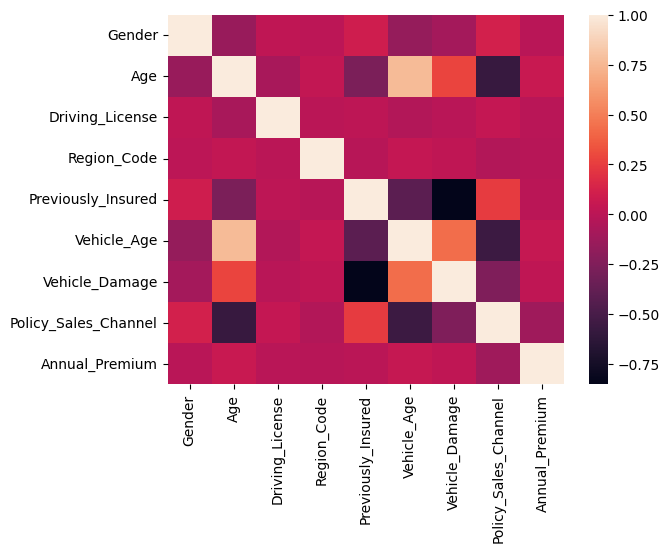

In [220]:
sns.heatmap(df.corr(method='pearson'))

In [221]:
# Compute Spearman Correlation Coefficient (s) for each pair of variables
# Compute Pearson Correlation Coefficient (p) for each pair of variables
for col1 in df:
    corr_df = pd.DataFrame(columns = ['s', 'p'])
    for col2 in df:
        s, p = stats.spearmanr(df[col1], df[col2])
        corr_df.loc[col2] = [round(s,4), round(p, 4)]
    print()
    print(col1)
    print(corr_df)


Gender
                           s       p
Gender                1.0000  0.0000
Age                  -0.1574  0.0000
Driving_License       0.0163  0.0000
Region_Code           0.0060  0.0918
Previously_Insured    0.0905  0.0000
Vehicle_Age          -0.1656  0.0000
Vehicle_Damage       -0.0982  0.0000
Policy_Sales_Channel  0.1202  0.0000
Annual_Premium       -0.0228  0.0000

Age
                           s       p
Gender               -0.1574  0.0000
Age                   1.0000  0.0000
Driving_License      -0.0667  0.0000
Region_Code           0.0064  0.0739
Previously_Insured   -0.2901  0.0000
Vehicle_Age           0.8263  0.0000
Vehicle_Damage        0.3033  0.0000
Policy_Sales_Channel -0.6485  0.0000
Annual_Premium        0.1014  0.0000

Driving_License
                           s       p
Gender                0.0163  0.0000
Age                  -0.0667  0.0000
Driving_License       1.0000  0.0000
Region_Code           0.0021  0.5555
Previously_Insured    0.0103  0.0039
Vehicle_

In [222]:
from sklearn.metrics import mean_absolute_error,r2_score, mean_squared_error
import random
scale = StandardScaler()
scaled = pd.DataFrame(scale.fit_transform(df))

random = random.seed(15020304) #N-number: 

x_train, x_test, y_train, y_test = train_test_split(scaled.iloc[:,:-1], scaled.iloc[:,-1], train_size=0.8,random_state=random)
print(x_train.shape, y_train.shape)

# LassoCV
lasso = LassoCV()
lasso.fit(x_train, y_train)
print(f'Optimal alpha: {lasso.alpha_}')

coef = dict()
for i in range(8):
  coef[df.columns[i]] = lasso.coef_[i]
print(f'coefficeints:\n{coef}')

y_pred = lasso.predict(x_test)
print(f'R^2: {lasso.score(x_test, y_test)}')
r2_lasso= lasso.score(x_test, y_test)
rmse_lasso = np.sqrt(mean_absolute_error(y_test,y_pred))
print(f'RMSE: {rmse_lasso}')

(62618, 8) (62618,)
Optimal alpha: 0.00012787774049225932
coefficeints:
{'Gender': 0.005321647709668568, 'Age': 0.0230872733146875, 'Driving_License': 0.0007067123054414486, 'Region_Code': -0.01747340429043771, 'Previously_Insured': 0.04291380654256563, 'Vehicle_Age': -0.04079186646448774, 'Vehicle_Damage': 0.0312597769329744, 'Policy_Sales_Channel': -0.13247196423365523}
R^2: 0.015776916743107106
RMSE: 0.8330258451465989


## Inference

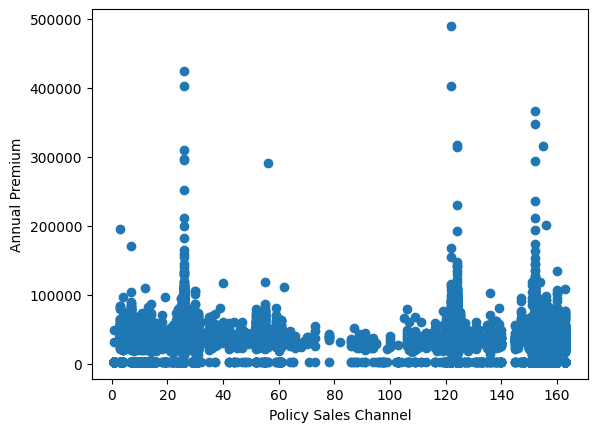

In [223]:
# Plot a scatter plot of Annual_Premium vs. Policy_Sales_Channel
plt.scatter(df['Policy_Sales_Channel'], df['Annual_Premium'])
plt.xlabel('Policy Sales Channel')
plt.ylabel('Annual Premium')
plt.show()

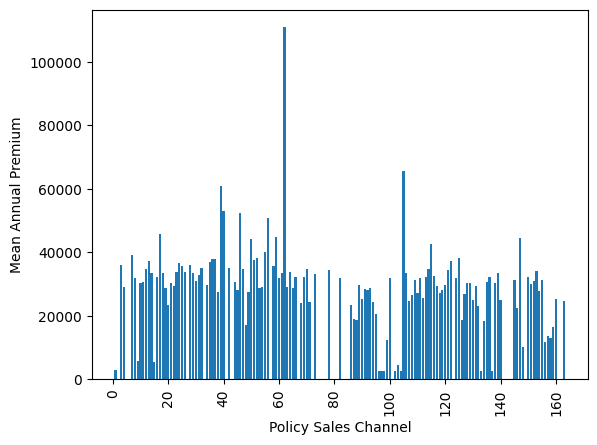

In [224]:
# Group the data by Policy_Sales_Channel and calculate the mean Annual_Premium
grouped_data = df.groupby('Policy_Sales_Channel')['Annual_Premium'].mean().reset_index()

# Sort the data by mean Annual_Premium
sorted_data = grouped_data.sort_values(by='Annual_Premium')

# Plot a bar chart of mean Annual_Premium for each Policy_Sales_Channel
plt.bar(sorted_data['Policy_Sales_Channel'], sorted_data['Annual_Premium'])
plt.xticks(rotation=90)
plt.xlabel('Policy Sales Channel')
plt.ylabel('Mean Annual Premium')
plt.show()

In [226]:
# create the copy of df
df_age = df.copy()

# create bins for age
bins = [20, 40, 60, 80]  # define the age ranges

# create a new column called 'age_range' based on the age bins
df_age['Age_range'] = pd.cut(df_age['Age'], bins, labels=[1, 2, 3])

# group the data by the age ranges
age_groups = df_age.groupby('Age_range')

# compute statistics for each age group
age_groups.mean()  # for example, compute the mean of other columns for each age group

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Policy_Sales_Channel,Annual_Premium
Age_range,,,,,,,,,
1,0.527581,27.488936,0.999977,25.984286,0.615911,0.252371,0.348582,138.169584,29763.577771
2,0.368219,48.760632,0.998376,26.823157,0.289657,1.079077,0.683931,77.812030,31594.200285
3,0.398173,68.642434,0.984819,27.109479,0.428660,1.113922,0.559368,70.799556,33600.097013


In [227]:
fig = px.box(df_age, x="Age_range", y="Annual_Premium")
fig.show()

In [232]:


fig = px.box(df_age, x="Vehicle_Damage", y="Annual_Premium")
fig.show()

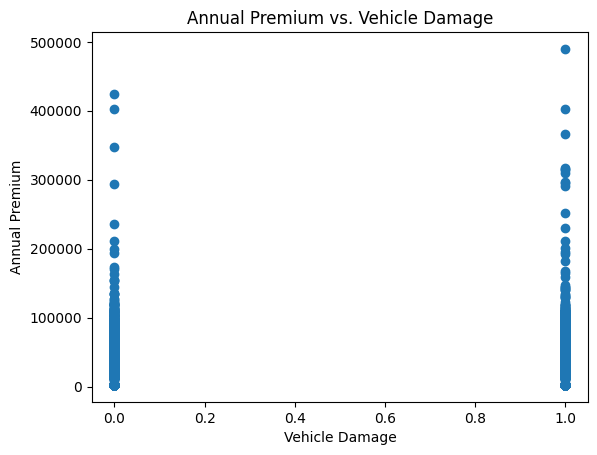

In [231]:
# Create a scatter plot of Annual_Premium vs. Vehicle_Damage
plt.scatter(df['Vehicle_Damage'], df['Annual_Premium'])

# Add labels and title
plt.xlabel('Vehicle Damage')
plt.ylabel('Annual Premium')
plt.title('Annual Premium vs. Vehicle Damage')

# Display the plot
plt.show()

## Prediction

In [246]:
x = df.drop(['Annual_Premium'],axis=1)
y = df['Annual_Premium']

In [261]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((62618, 8), (15655, 8), (62618,), (15655,))

In [273]:
#linear Regression
from sklearn.linear_model import LinearRegression, ElasticNet, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

cols = {'Model' : [], 'R^2': [], 'Mean Absolute Error': [], 'Mean Squared Error': [], 'Root Mean Squared Error': []}
res = pd.DataFrame(cols)

lr = LinearRegression()
rr = Ridge()
en = ElasticNet(alpha=0.1, l1_ratio=0.5)
dtr = DecisionTreeRegressor()
rfr = RandomForestRegressor()

models = [lr, rr, en, dtr, rfr]
model_str = ['LR', 'RR', 'EN', 'DTR', 'RFR']
i = 0
for model in models:
    
    # Create a model and train it on the training data
    model.fit(x_train, y_train)

    # Use the model to predict the Annual_Premium values for the testing data
    y_pred = model.predict(x_test)

    # Evaluate the performance of the model using mean squared error and R-squared
    model_res = {'Model': model_str[i],
                'R^2':r2_score(y_test, y_pred),
                'Mean Absolute Error': mean_absolute_error(y_test, y_pred),
                'Mean Squared Error': mean_squared_error(y_test, y_pred),
                'Root Mean Squared Error':np.sqrt(mean_squared_error(y_test, y_pred))}
    res = res.append(model_res, ignore_index=True)
    i+= 1
#     r2 = r2_score(y_test, y_pred)
#     mae = mean_absolute_error(y_test, y_pred)
#     mse = mean_squared_error(y_test, y_pred)
#     rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    

/var/folders/2s/3rcg_bzs15v_mbn0yrny0ffm0000gn/T/ipykernel_93728/3998782292.py:34: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/2s/3rcg_bzs15v_mbn0yrny0ffm0000gn/T/ipykernel_93728/3998782292.py:34: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/2s/3rcg_bzs15v_mbn0yrny0ffm0000gn/T/ipykernel_93728/3998782292.py:34: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/2s/3rcg_bzs15v_mbn0yrny0ffm0000gn/T/ipykernel_93728/3998782292.py:34: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/2s/3rcg_bzs15v_mbn0yrny0ffm0000gn/T/ipykernel_93728/3998782292.py:34: FutureWarning:

The frame.append method is de

In [274]:
res

,Model,R^2,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,LR,0.015436,11900.634317,2.742563e+08,16560.685794
1,RR,0.015436,11900.633195,2.742564e+08,16560.688796
2,EN,0.014787,11899.065969,2.744371e+08,16566.143781
3,DTR,-0.056348,11663.185360,2.942521e+08,17153.778645
4,RFR,0.145342,10745.890787,2.380701e+08,15429.521200
